In [1]:
from utils import DataArgs
import pandas as pd
args = DataArgs()
predictions=pd.read_pickle("data/predections.pkl")

In [2]:
import qlib
# init qlib
qlib.init(provider_uri=args.qlib_data_path)


[13360:MainThread](2024-10-30 10:31:32,214) INFO - qlib.Initialization - [config.py:416] - default_conf: client.
[13360:MainThread](2024-10-30 10:31:32,923) INFO - qlib.Initialization - [__init__.py:74] - qlib successfully initialized based on client settings.
[13360:MainThread](2024-10-30 10:31:32,925) INFO - qlib.Initialization - [__init__.py:76] - data_path={'__DEFAULT_FREQ': WindowsPath('C:/07-pycharm/InvariantStock/data/qlib_data/cn_data')}


In [3]:
from predict import RankIC
from qlib.contrib.report import analysis_position, analysis_model

# 绘制预测数据和目标值的ic曲线
predictions = predictions.rename(columns={'LABEL0': 'label'})
# 打印RANKIC
print(RankIC(predictions,column1='label',column2='score'))
# 绘制具体曲线
analysis_position.score_ic_graph(predictions, show_notebook=True)

     RankIC  RankIC_IR
0  0.014116   0.246978


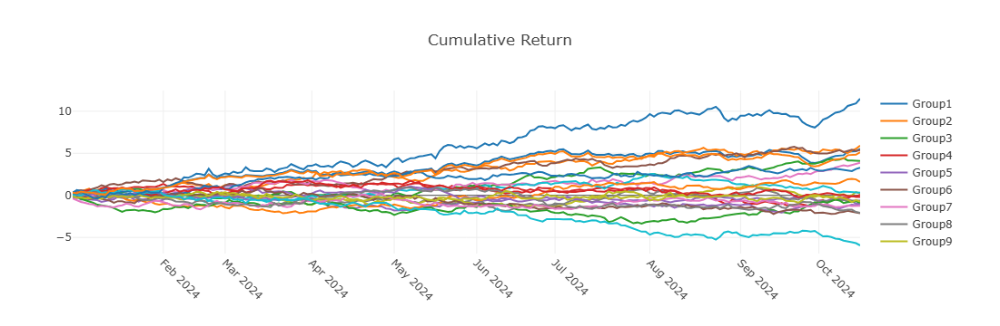

In [4]:
# 调用模型性能图函数，设置 N = 10
analysis_model.model_performance_graph(predictions, N=20)

In [5]:
from pprint import pprint
import qlib.contrib.report as qcr
from qlib.utils.time import Freq
from qlib.utils import flatten_dict
from qlib.backtest import backtest, executor
from qlib.contrib.evaluate import backtest_daily
from qlib.contrib.evaluate import risk_analysis
from qlib.contrib.strategy import TopkDropoutStrategy


CSI_BENCH = "SH000906" # 000300"
FREQ = "day"
STRATEGY_CONFIG = {
    "topk": 80,
    "n_drop": 20,
    # pred_score, pd.Series
    "signal": predictions,
}
EXECUTOR_CONFIG = {
    "time_per_step": "day",
    "generate_portfolio_metrics": True,
}
backtest_config = {
    "start_time": args.test_start_time,
    "end_time": args.data_end_time,
    "account": 10000000,
    "benchmark": CSI_BENCH,
    "exchange_kwargs": {
        "freq": FREQ,
        "limit_threshold": 0.095,
        "deal_price":"$vwap", #"close",
        "open_cost": 0.0005,
        "close_cost": 0.0015,
        "min_cost": 5,
    },
}

from qlib.contrib.strategy import TopkDropoutStrategy

class MyStrategy(TopkDropoutStrategy):
    def generate_order_list(self, current_time, pred_scores):
        order_list = super().generate_order_list(current_time, pred_scores)
        print(f"Selected stocks on {current_time}: {order_list}")
        return order_list

# 使用该策略进行回测

# strategy object
strategy_obj = MyStrategy(**STRATEGY_CONFIG)
# executor object
executor_obj = executor.SimulatorExecutor(**EXECUTOR_CONFIG)
# backtest
portfolio_metric_dict, indicator_dict = backtest(executor=executor_obj, strategy=strategy_obj, **backtest_config)
analysis_freq = "{0}{1}".format(*Freq.parse(FREQ))
# backtest info
report_normal_df, positions_normal = portfolio_metric_dict.get(analysis_freq)

[13360:MainThread](2024-10-30 10:31:38,773) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x000002D112032340>
[13360:MainThread](2024-10-30 10:31:38,823) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange
[13360:MainThread](2024-10-30 10:32:22,673) WARNING - qlib.online operator - [exchange.py:219] - $vwap field data contains nan.
[13360:MainThread](2024-10-30 10:32:22,676) WARNING - qlib.online operator - [exchange.py:219] - $vwap field data contains nan.


backtest loop:   0%|          | 0/195 [00:00<?, ?it/s]

C:\Users\robert\anaconda3\envs\stock\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice

C:\Users\robert\anaconda3\envs\stock\lib\site-packages\qlib\utils\index_data.py:481: RuntimeWarning:

Mean of empty slice



In [6]:
# import pandas as pd
# report_normal_df=pd.read_excel('data/report_normal_df.xlsx')
# report_normal_df['datetime']=pd.to_datetime(report_normal_df['datetime'])
# report_normal_df.set_index(['datetime'],inplace=True)
report_normal_df

,account,return,total_turnover,turnover,total_cost,cost,value,cash,bench
datetime,,,,,,,,,
2024-01-02,1.000000e+07,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,1.000000e+07,-0.010518
2024-01-03,9.990906e+06,-0.000439,9.400386e+06,0.940039,4700.192927,0.000470,9.395992e+06,5.949140e+05,-0.002138
2024-01-04,9.913313e+06,-0.007280,1.445625e+07,0.506046,9562.137504,0.000487,9.711093e+06,2.022200e+05,-0.009053
2024-01-05,9.823535e+06,-0.008569,1.931485e+07,0.490109,14397.929491,0.000488,9.671766e+06,1.517686e+05,-0.007625
2024-01-08,9.626968e+06,-0.019530,2.403125e+07,0.480113,19110.675692,0.000480,9.487234e+06,1.397342e+05,-0.015271
...,...,...,...,...,...,...,...,...,...
2024-10-21,1.030490e+07,0.006707,8.851391e+08,0.515204,880656.679783,0.000515,1.015034e+07,1.545624e+05,0.004764
2024-10-22,1.045543e+07,0.015082,8.900273e+08,0.474355,885547.866337,0.000475,1.029976e+07,1.556706e+05,0.006489
2024-10-23,1.052336e+07,0.006975,8.949501e+08,0.470837,890543.482863,0.000478,1.022706e+07,2.963011e+05,0.003904


['analysis_position.report_graph', 'analysis_position.score_ic_graph', 'analysis_position.cumulative_return_graph', 'analysis_position.risk_analysis_graph', 'analysis_position.rank_label_graph', 'analysis_model.model_performance_graph']


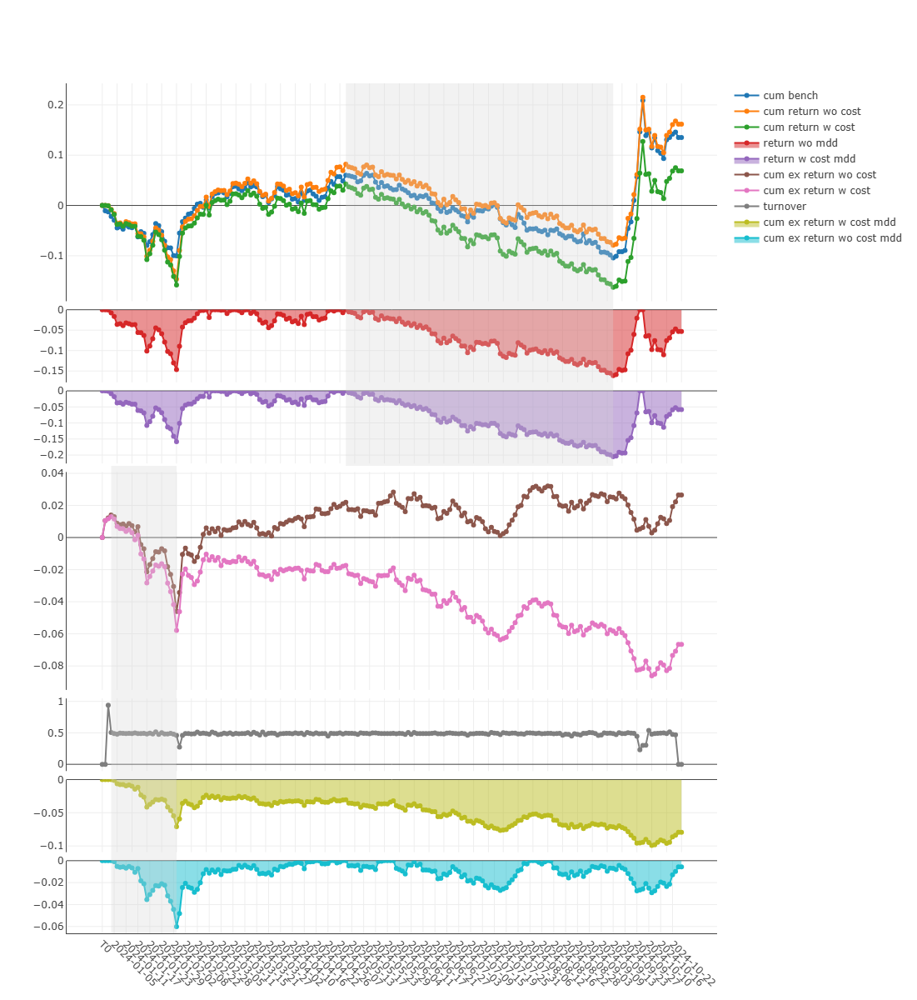

In [7]:
import qlib.contrib.report as qcr

print(qcr.GRAPH_NAME_LIST)
analysis_position.report_graph(report_normal_df)

In [8]:
from qlib.contrib.evaluate import risk_analysis
analysis = dict()
analysis["excess_return_without_cost"] = risk_analysis(
    report_normal_df["return"] - report_normal_df["bench"], freq=analysis_freq
)
analysis["excess_return_with_cost"] = risk_analysis(
    report_normal_df["return"] - report_normal_df["bench"] - report_normal_df["cost"], freq=analysis_freq
)

analysis_df = pd.concat(analysis)
pprint(analysis_df)

                                                  risk
excess_return_without_cost mean               0.000136
                           std                0.004177
                           annualized_return  0.032358
                           information_ratio  0.502170
                           max_drawdown      -0.060096
excess_return_with_cost    mean              -0.000341
                           std                0.004189
                           annualized_return -0.081236
                           information_ratio -1.256963
                           max_drawdown      -0.099242
